In [1]:
import pickle
from helper_fxns import convert_param_vec_dict_to_param_dict, gelman_rubin_trace_dict, print_convergence_summary, sample_plots, create_trace_matrix, plot_histograms
from earm.lopez_embedded import model
%matplotlib inline
import os
import numpy as np
from corner import corner
import matplotlib.pyplot as plt
import seaborn as sns

/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)
/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/utils/traitlets.py:5: UserWarning: IPython.utils.traitlets has moved to a top-level traitlets package.
  warn("IPython.utils.traitlets has moved to a top-level traitlets package.")


In [2]:
len(model.parameters_rules())

105

In [3]:
os.chdir('/Users/Erin/git/accre_data_analysis/normal_priors_sd3')

In [15]:
traces = {}
for trace in ['a', 'b', 'c', 'd']:
    traces[trace] = [np.load('earm_dreamz_12chain_normal_'+str(trace)+'_sampled_params_chain_0.npy')]
    for chain in range(1, 12):
        traces[trace].append(np.load('earm_dreamz_12chain_normal_'+str(trace)+'_sampled_params_chain_'+str(chain)+'.npy'))

In [16]:
logps = {}
for trace in ['a', 'b', 'c', 'd']:
    logps[trace] = [np.load('earm_dreamz_12chain_normal_'+str(trace)+'_logps_chain_0.npy')]
    print 'Logp of trace: ',trace,' chain: 0 = ',logps[trace][-1]
    for chain in range(1, 12):
        logps[trace].append(np.load('earm_dreamz_12chain_normal_'+str(trace)+'_logps_chain_'+str(chain)+'.npy'))
        print 'Logp of trace: ',trace,' chain: ',chain,' = ',logps[trace][-1][-1]

Logp of trace:  a  chain: 0 =  [[-2682.30807465]
 [-2682.30807465]
 [-2682.30807465]
 ..., 
 [  151.59383965]
 [  151.59383965]
 [  151.59383965]]
Logp of trace:  a  chain:  1  =  [ 148.49567859]
Logp of trace:  a  chain:  2  =  [ 160.79836976]
Logp of trace:  a  chain:  3  =  [ 154.91237323]
Logp of trace:  a  chain:  4  =  [ 156.88132025]
Logp of trace:  a  chain:  5  =  [ 164.71991014]
Logp of trace:  a  chain:  6  =  [ 159.43094333]
Logp of trace:  a  chain:  7  =  [ 148.98756085]
Logp of trace:  a  chain:  8  =  [ 150.64404458]
Logp of trace:  a  chain:  9  =  [ 147.76394617]
Logp of trace:  a  chain:  10  =  [ 154.72829246]
Logp of trace:  a  chain:  11  =  [ 147.98512084]
Logp of trace:  b  chain: 0 =  [[-2506.33535457]
 [-2506.33535457]
 [-2506.33535457]
 ..., 
 [  152.51534966]
 [  152.51534966]
 [  152.51534966]]
Logp of trace:  b  chain:  1  =  [ 147.63241967]
Logp of trace:  b  chain:  2  =  [ 157.58505363]
Logp of trace:  b  chain:  3  =  [ 152.69786875]
Logp of trace:  b 

In [17]:
traces['b'][0][:,72]

array([-1.23580949, -1.23580949, -1.23580949, ..., -0.1660544 ,
       -0.1660544 , -0.1660544 ])

In [18]:
traces['a'][0][:,72]

array([-1.15275121, -1.15275121, -1.15275121, ...,  0.33279881,
        0.33279881,  0.33279881])

In [19]:
param_trace_dicts = {}
param_trace_dict_a = {}
gelman_rubin_dicts = {}
param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]
for run in ['a', 'b', 'c', 'd']:
    for i, param in enumerate(model.parameters_rules()):
        param_trace_dict_a[param.name] = [traces[run][chain][:,i] for chain in range(len(traces[run]))]
    param_trace_dicts[run] = param_trace_dict_a
    gelman_rubin_dicts[run] = gelman_rubin_trace_dict(param_trace_dict_a)
    param_trace_dict_a = {}
    param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]

In [20]:
print_convergence_summary(param_trace_dicts['a'])

Number of parameters with GR below 1.2:  21  of  105  parameters.
Percent of parameters with GR below 1.2:  20.0
Number of parameters with GR below 1.1:  4  of  105  parameters.
Percent of parameters with GR below 1.1:  3.80952380952


[21, 20.0, 4, 3.8095238095238098]

In [21]:
print_convergence_summary(param_trace_dicts['b'])

Number of parameters with GR below 1.2:  73  of  105  parameters.
Percent of parameters with GR below 1.2:  69.5238095238
Number of parameters with GR below 1.1:  21  of  105  parameters.
Percent of parameters with GR below 1.1:  20.0


[73, 69.52380952380952, 21, 20.0]

In [22]:
print_convergence_summary(param_trace_dicts['c'])

Number of parameters with GR below 1.2:  22  of  105  parameters.
Percent of parameters with GR below 1.2:  20.9523809524
Number of parameters with GR below 1.1:  3  of  105  parameters.
Percent of parameters with GR below 1.1:  2.85714285714


[22, 20.952380952380953, 3, 2.857142857142857]

In [23]:
print_convergence_summary(param_trace_dicts['d'])

Number of parameters with GR below 1.2:  39  of  105  parameters.
Percent of parameters with GR below 1.2:  37.1428571429
Number of parameters with GR below 1.1:  7  of  105  parameters.
Percent of parameters with GR below 1.1:  6.66666666667


[39, 37.142857142857146, 7, 6.666666666666667]

In [24]:
param_trace_dicts['d']['bind_L_R_to_LR_kf']

[array([-6.18937003, -6.18937003, -6.82574344, ..., -7.27780438,
        -7.27780438, -7.27780438]),
 array([-6.25247387, -6.25247387, -6.65656121, ..., -6.92913271,
        -6.92913271, -6.92913271]),
 array([-6.18604527, -6.18604527, -6.18604527, ..., -7.05864917,
        -7.05864917, -7.05864917]),
 array([-6.20540149, -6.20540149, -6.20540149, ..., -7.35986146,
        -7.35986146, -7.35986146]),
 array([-6.17701155, -6.17701155, -6.17701155, ..., -6.64019999,
        -6.64019999, -6.64019999]),
 array([-6.38219762, -6.38219762, -5.67494675, ..., -7.58378981,
        -7.58378981, -7.58378981]),
 array([-6.39527575, -6.39527575, -6.39527575, ..., -7.42097869,
        -7.42097869, -7.42097869]),
 array([-6.3776965 , -6.3776965 , -6.3776965 , ..., -7.43657058,
        -7.43657058, -7.43657058]),
 array([-6.1809483 , -6.1809483 , -6.1809483 , ..., -7.59882956,
        -7.59882956, -7.59882956]),
 array([-6.39172112, -6.39172112, -6.39172112, ..., -7.2182763 ,
        -7.2182763 , -7.21

50000
12
50000


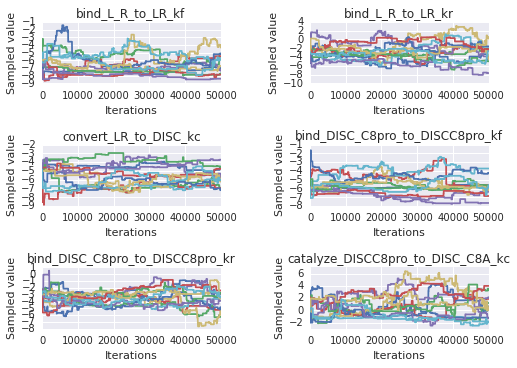

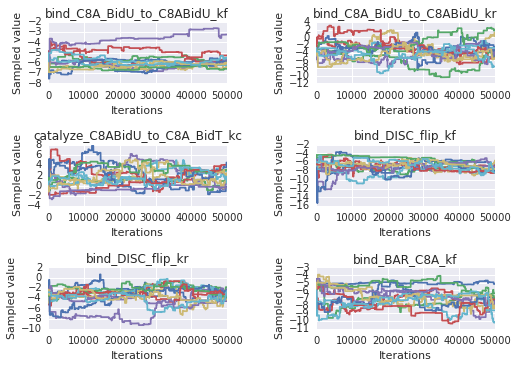

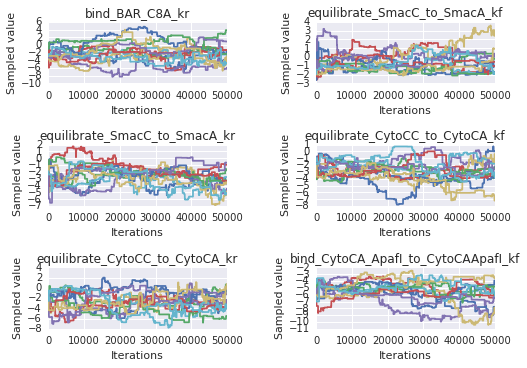

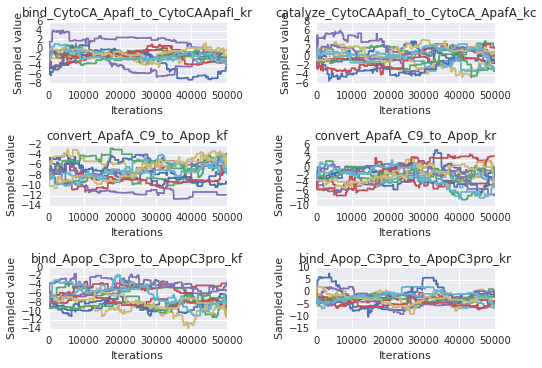

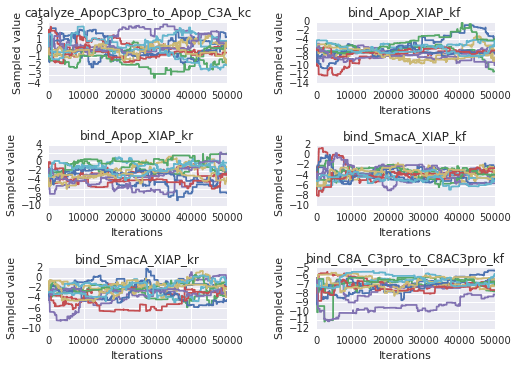

...

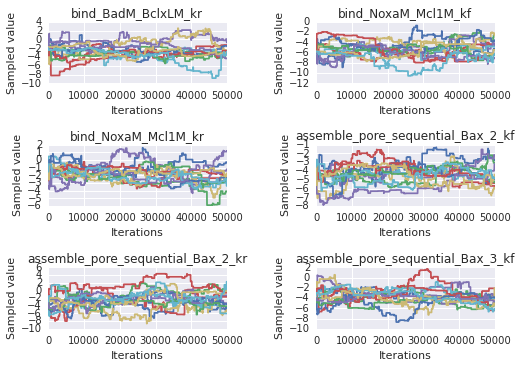

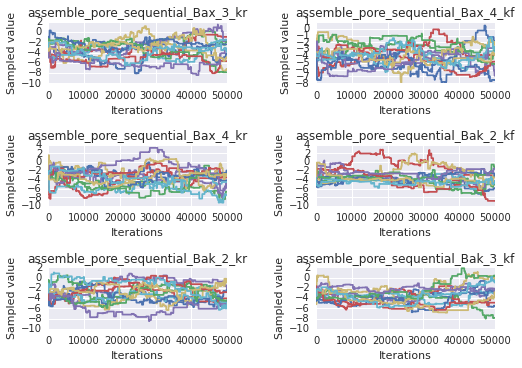

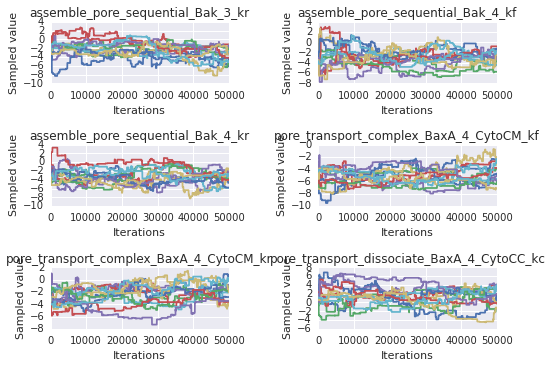

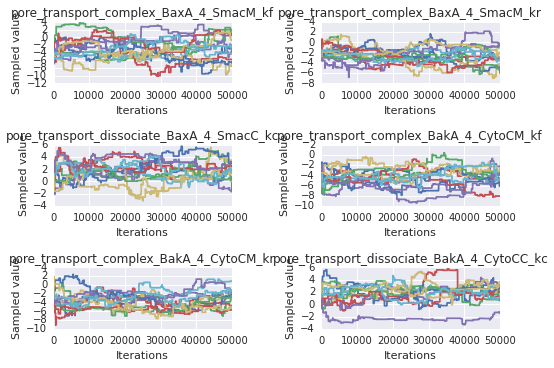

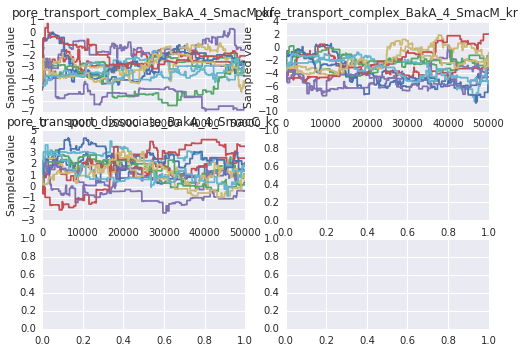

In [25]:
sample_plots(param_trace_dicts['a'])

In [26]:
trace_arr_a = create_trace_matrix(param_trace_dicts['a'], burnin=20000, thin=1)
trace_arr_b = create_trace_matrix(param_trace_dicts['b'], burnin=20000, thin=1)
trace_arr_c = create_trace_matrix(param_trace_dicts['c'], burnin=20000, thin=1)
trace_arr_d = create_trace_matrix(param_trace_dicts['d'], burnin=20000, thin=1)

/System/Library/Frameworks/Python.framework/Versions/2.7/Extras/lib/python/matplotlib/pyplot.py:412: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_num_figures`).
  max_open_warning, RuntimeWarning)


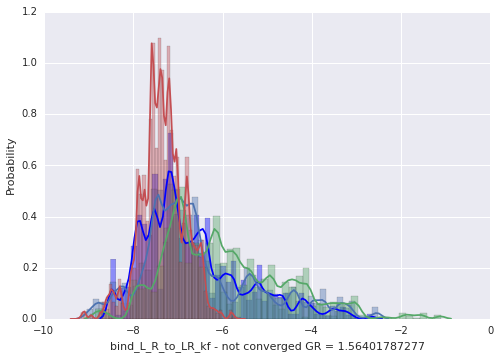

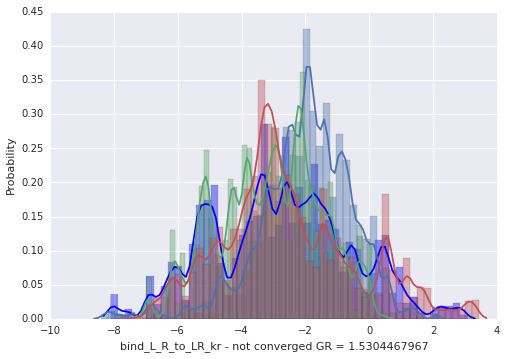

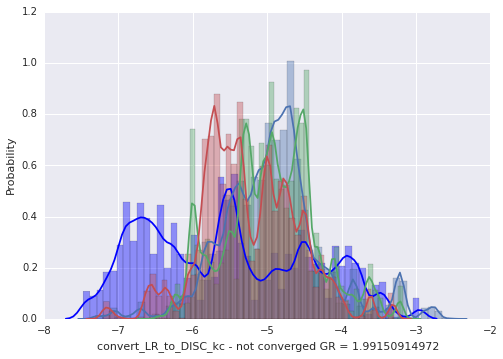

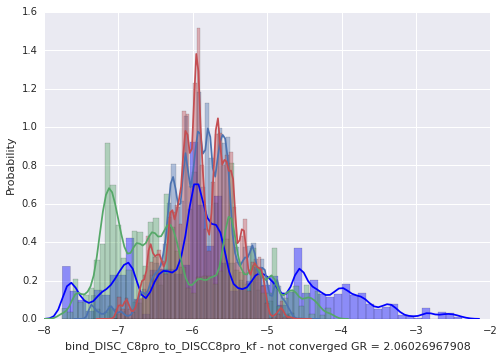

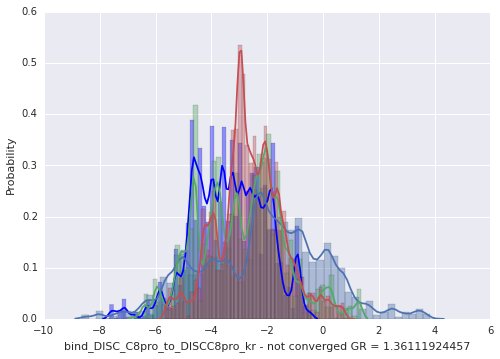

...

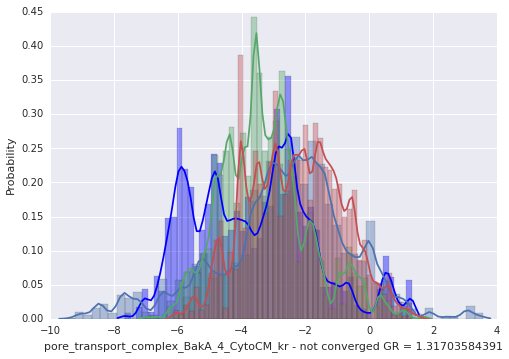

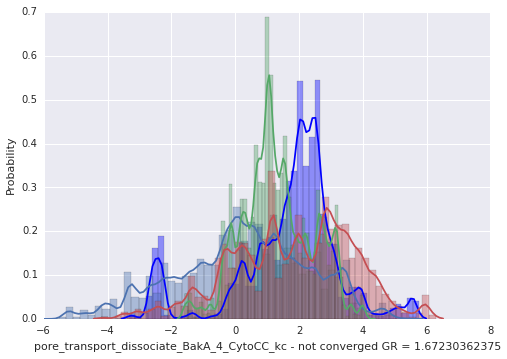

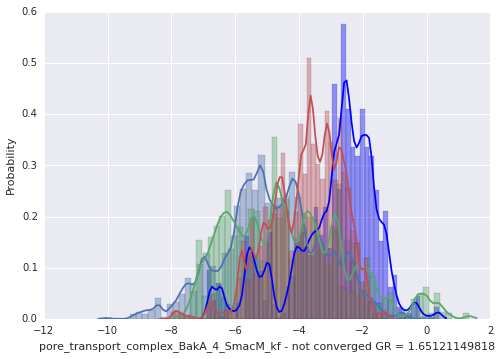

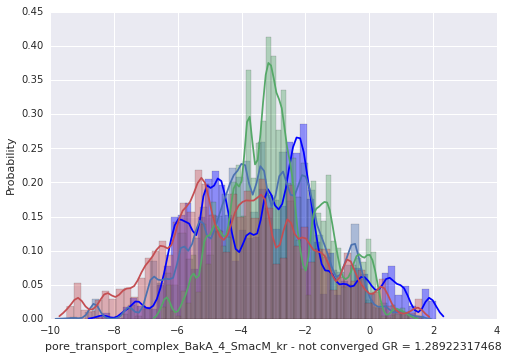

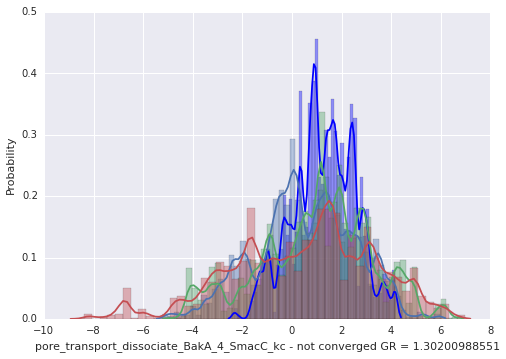

In [27]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    sns.plotting_context('notebook')
    ax = sns.distplot(trace_arr_a[:,dim], hist=True, color='b')
    sns.distplot(trace_arr_b[:,dim], hist=True)
    sns.distplot(trace_arr_c[:,dim], hist=True)
    sns.distplot(trace_arr_d[:,dim], hist=True)
    if gelman_rubin_dicts['a'][param_name] < 1.2:
        sns.axlabel(param_name+' - converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')
    else:
        sns.axlabel(param_name+' - not converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')

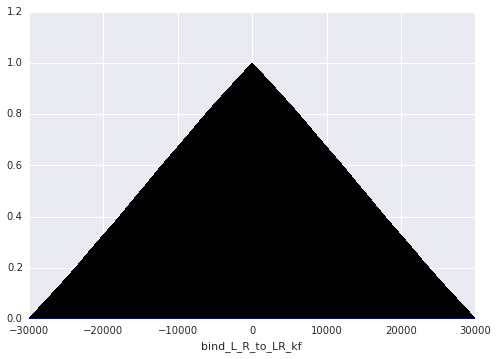

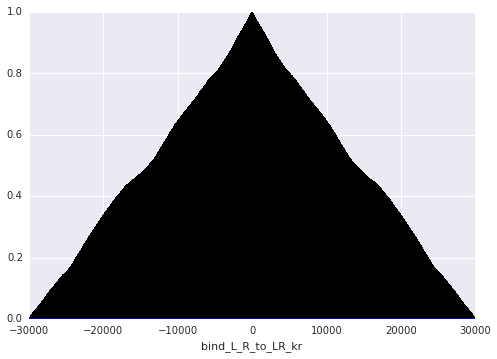

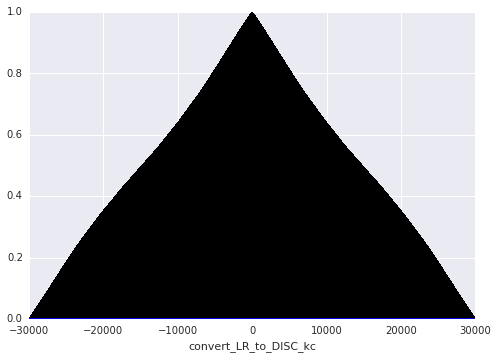

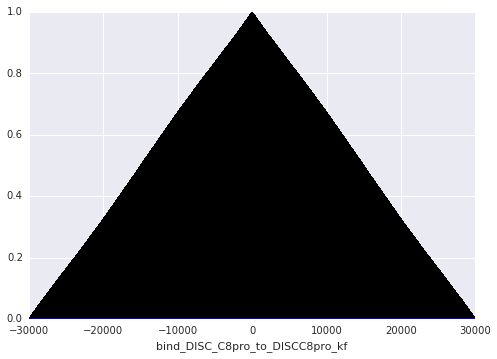

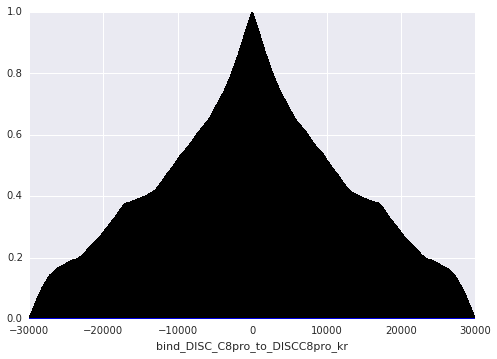

...

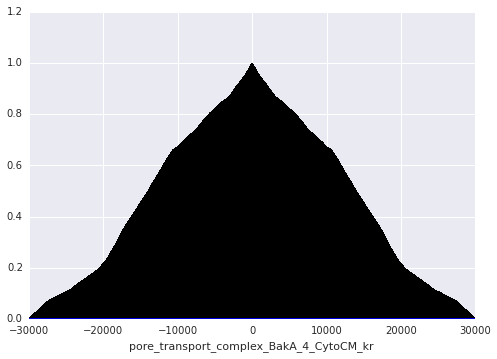

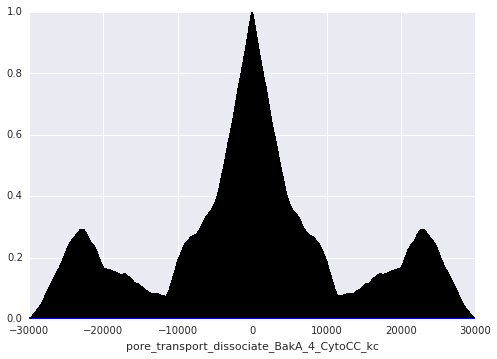

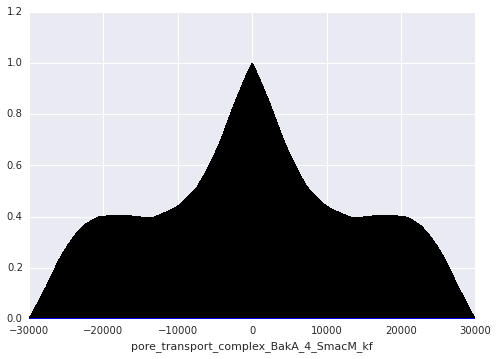

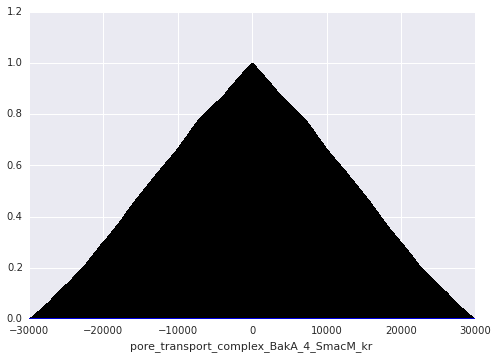

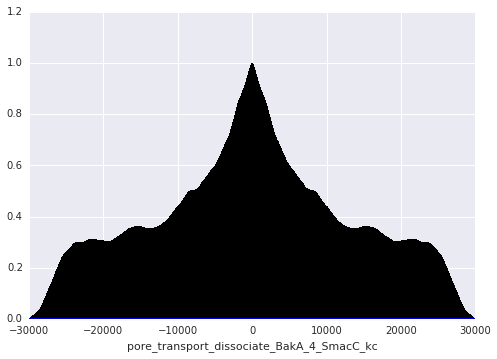

In [28]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][0][20000::,dim], maxlags=None)
    plt.xlabel(str(param_name))

In [ ]:
corner(trace_arr_a[:,50:60:], labels=param_trace_dict_a['param_list'][50:60], bins=10)